In [70]:
import os
import sys
sys.path.append(os.path.join(".."))

import cv2
import numpy as np 

from utils.imutils import jimshow, jimshow_channel
import matplotlib.pyplot as plt

In [71]:
image = cv2.imread(os.path.join("..", "data", "img", "trex.png"))

In [72]:
image.shape

(228, 350, 3)

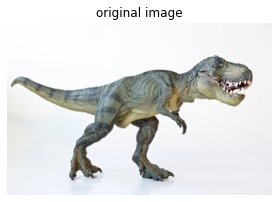

In [73]:
jimshow(image, "original image")

In [74]:
image.shape[0]//2

114

In [75]:
def image_center(image):
    height = image.shape[0]//2
    
    width = image.shape[1]//2

    center = (height, width)
    
    return center

In [76]:
height = image.shape[0]
    
width = image.shape[1]

In [77]:
center = image_center(image)

In [78]:
M = cv2.getRotationMatrix2D(center = center, angle = 45, scale = 1)

In [79]:
rotated = cv2.warpAffine(image, M, (width, height))

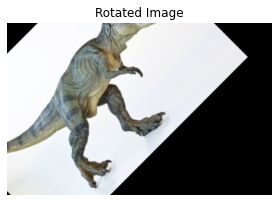

In [80]:
jimshow(rotated, "Rotated Image")

In [81]:
class RotatedImage:

    def __init__(self, image, center=None, angle=45):

        height = self.get_height(image)

        width = self.get_width(image)

        if center is None:

            center = self.image_center(height, width)

        M = cv2.getRotationMatrix2D(center = center, angle = angle, scale = 1)

        rotated = cv2.warpAffine(image, M, (width, height))

        jimshow(rotated, "Rotated Image")

    def image_center(self, height, width):

        center = (height//2, width//2)
    
        return center

    def get_height(self, image):
        
        height = image.shape[0]
        
        return height

    def get_width(self, image):
        
        width = image.shape[1]
        
        return width

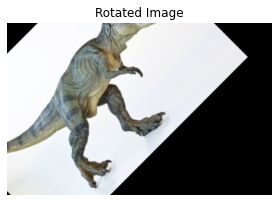

In [82]:
RotatedImage(image)

## Splitting channels

In [83]:
image = cv2.imread(os.path.join("..", "data", "img", "terasse.jpeg"))

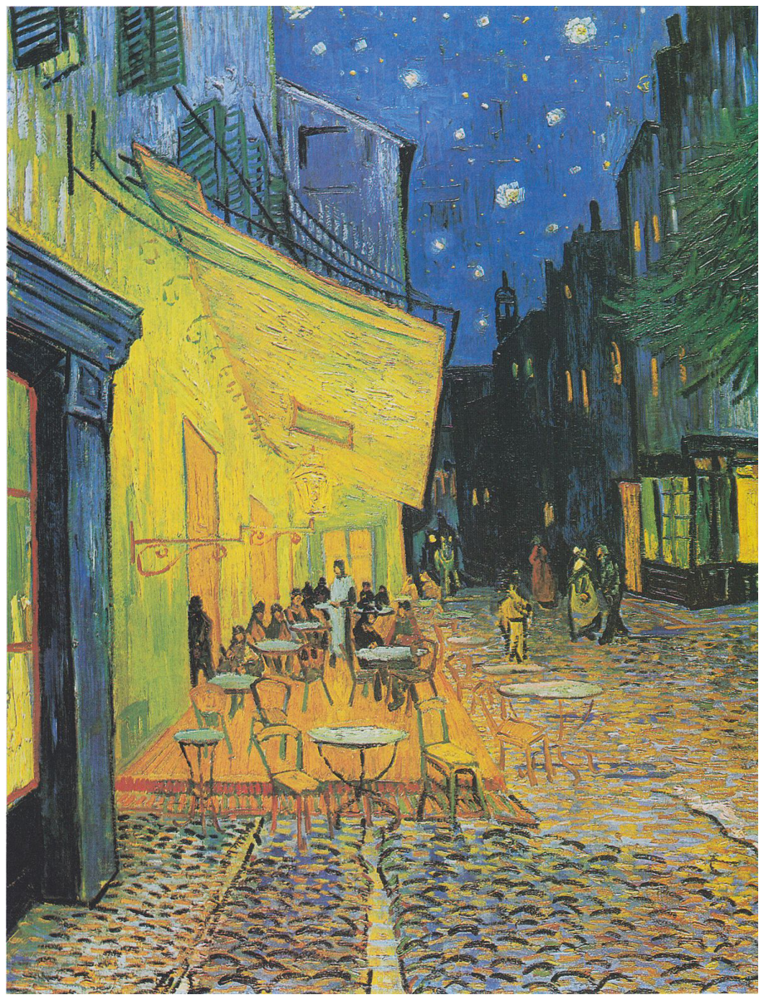

In [84]:
jimshow(image)

In [85]:
(blue, green, red ) = cv2.split(image)

In [86]:
print(blue)

[[244 236 221 ... 104  99  94]
 [249 240 145 ... 115  98  74]
 [232 237 151 ... 113 102  78]
 ...
 [207 169 173 ... 142 137 147]
 [214 182 178 ... 101 123 144]
 [196 138 161 ... 191 199 191]]


In [87]:
cv2.split(image)

[array([[244, 236, 221, ..., 104,  99,  94],
        [249, 240, 145, ..., 115,  98,  74],
        [232, 237, 151, ..., 113, 102,  78],
        ...,
        [207, 169, 173, ..., 142, 137, 147],
        [214, 182, 178, ..., 101, 123, 144],
        [196, 138, 161, ..., 191, 199, 191]], dtype=uint8),
 array([[231, 237, 239, ...,  74,  77,  87],
        [236, 239, 160, ...,  85,  78,  67],
        [220, 234, 160, ...,  83,  82,  72],
        ...,
        [209, 171, 176, ..., 193, 187, 197],
        [233, 201, 198, ..., 151, 171, 192],
        [230, 173, 195, ..., 233, 241, 233]], dtype=uint8),
 array([[229, 233, 232, ...,  55,  59,  68],
        [234, 235, 152, ...,  68,  60,  48],
        [218, 229, 150, ...,  66,  65,  53],
        ...,
        [187, 149, 151, ..., 219, 215, 225],
        [224, 192, 186, ..., 169, 189, 210],
        [236, 176, 195, ..., 245, 253, 246]], dtype=uint8)]

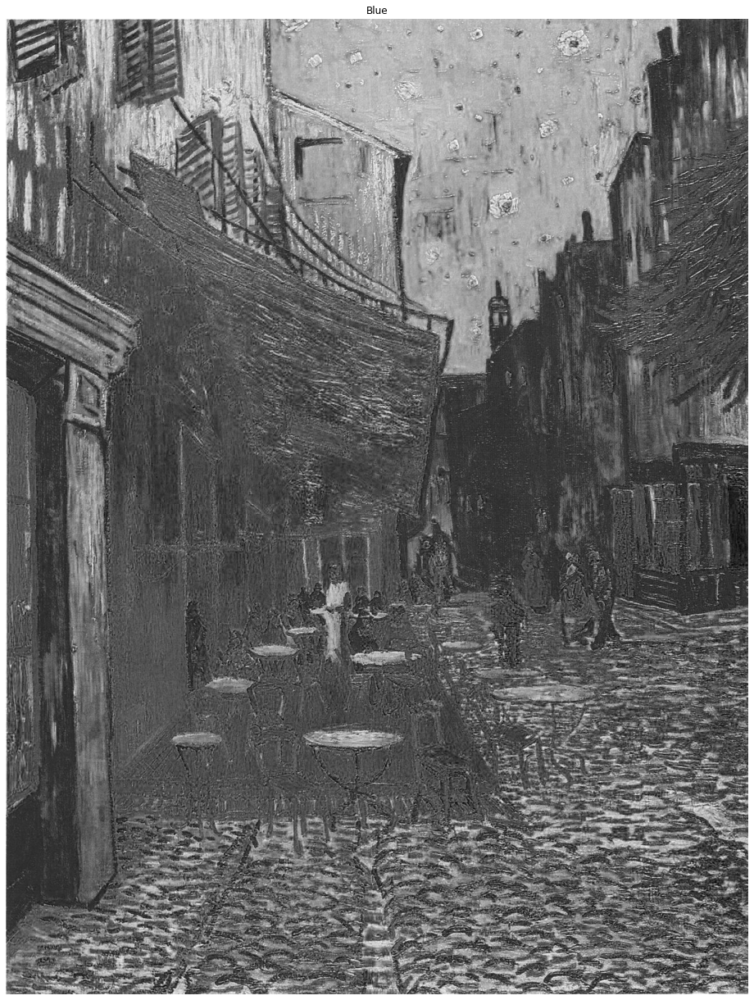

In [88]:
jimshow_channel(blue, "Blue")

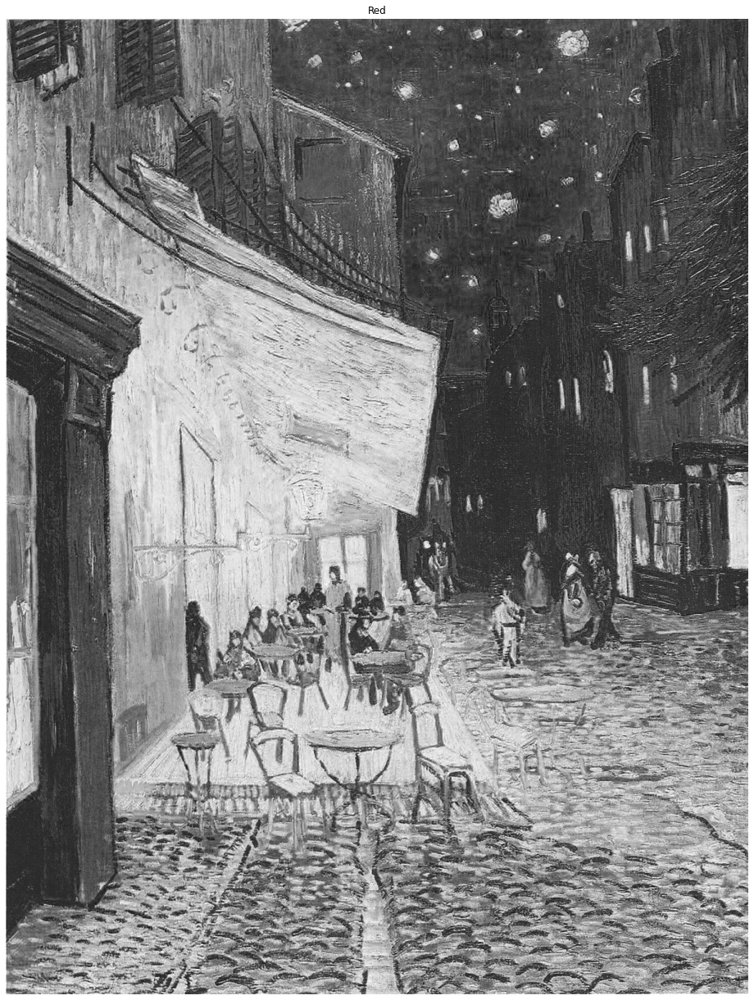

In [90]:
jimshow_channel(red, "Red")

#### Define empty numpy array

In [93]:
empty_array = np.zeros(image.shape[:2], dtype="uint8")

In [94]:
empty_array

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [99]:
merged_image = cv2.merge([empty_array,empty_array,red])

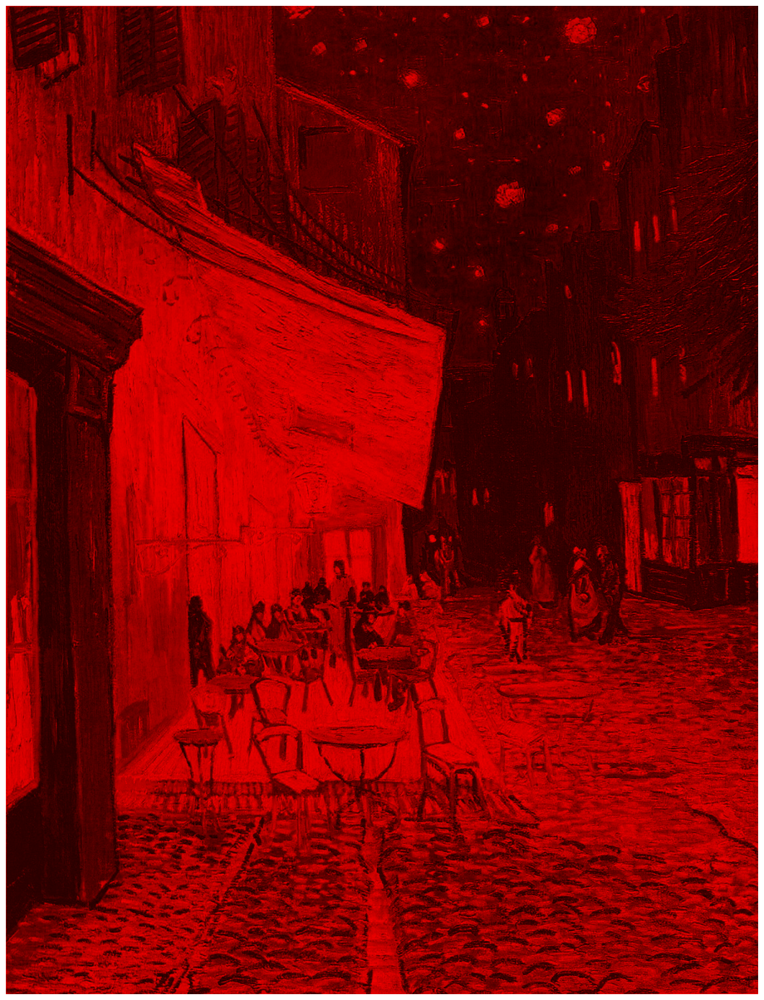

In [100]:
jimshow(merged_image)

## Histograms

In [118]:
grey_image = image.flatten()

In [115]:
#plt.hist(array, number_of_bins, [range_of_possible_values])

In [116]:
#plt.hist(array, 256, [0,256]) # Our array of interest, number of bins, range of possible values

In [117]:
image.shape[:2]

(1576, 1200)

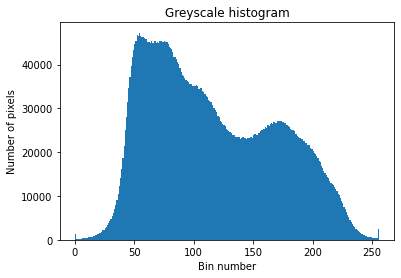

In [122]:
plt.figure()
plt.hist(grey_image, 256, [0,256])
plt.title("Greyscale histogram")
plt.xlabel("Bin number")
plt.ylabel("Number of pixels")
plt.show()

## Studying multiple images

In [142]:
def plot_greyscale(input_image, image_name):

    # Initialize figure
    plt.figure()

    # Plot histogram 
    plt.hist(input_image.flatten(), 256, [0,256])

    # Plot title
    plt.title(f"{image_name}")

    # X labels
    plt.xlabel("Bin number")

    # Y labels
    plt.ylabel("Number of pixels")

    #Show plot
    plt.show()

In [143]:
plot_greyscale(image)

TypeError: plot_greyscale() missing 1 required positional argument: 'image_name'

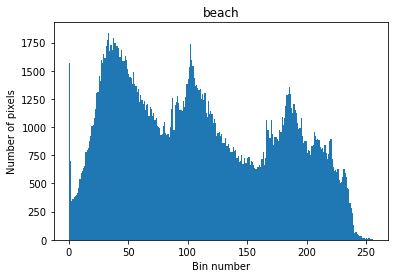

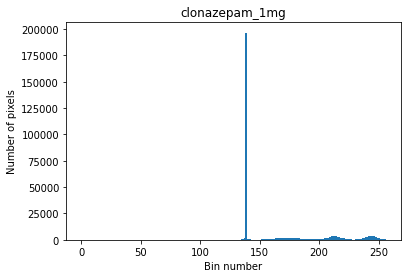

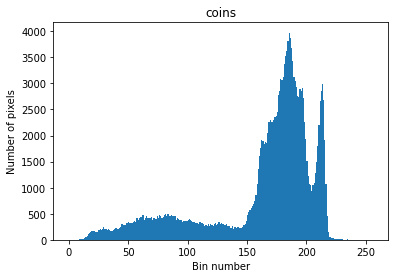

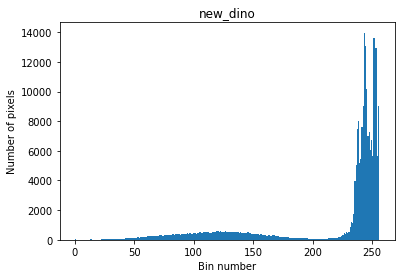

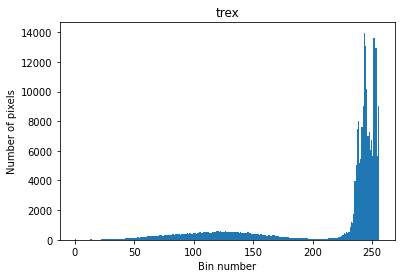

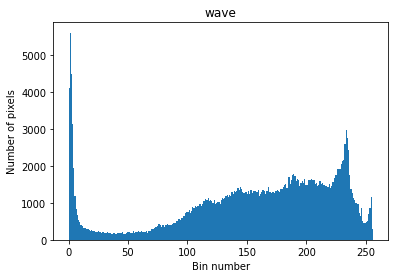

In [146]:
from pathlib import Path # Importing pathlib

root_dir = Path.cwd()  # Setting root directory.

data_dir = Path.cwd().parent / "data" / "img"  # Setting data directory.

files = [file for file in data_dir.glob("*.png") if file.is_file()]  # Using list comprehension to get all the file names if they are files.

# Looping through the files
for file in data_dir.glob("*png"):

    # Load image
    image = cv2.imread(str(file))

    # Plot greyscale
    plot_greyscale(image, file.stem)

'.png'